## Project 3 Making Dataset

In [43]:
import os
from PIL import Image
import numpy as np

# Path to the folder containing the sign language images
base_path = "D:/Sign Language"

# List of folder names for capital letters A to Z and digits 0 to 9
folders = ["aug_" + chr(65 + i) for i in range(26)] + ["aug_" + str(i) for i in range(10)]

# Initialize empty lists for images and labels
images = []
labels = []

# Iterate through each folder
for folder in folders:
    folder_path = os.path.join(base_path, folder)
    
    # Iterate through each file in the folder
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        
        # Open the image file
        image = Image.open(file_path)
        
        # Convert the image to a numpy array
        image_array = np.array(image)
        
        # Append the image array to the list of images
        images.append(image_array)
        
        # Append the label (folder name) to the list of labels
        labels.append(folder)

# Convert the lists to numpy arrays
images = np.array(images)
labels = np.array(labels)



In [67]:
import tensorflow as tf

# Create a TensorFlow dataset
dataset = tf.data.Dataset.from_tensor_slices((images, labels))


In [44]:
# Print the shapes of images and labels
print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (17553, 256, 256, 3)
Labels shape: (17553,)


In [45]:

# Print the unique labels
unique_labels = np.unique(labels)
print("Unique Labels:", unique_labels)

Unique Labels: ['aug_0' 'aug_1' 'aug_2' 'aug_3' 'aug_4' 'aug_5' 'aug_6' 'aug_7' 'aug_8'
 'aug_9' 'aug_A' 'aug_B' 'aug_C' 'aug_D' 'aug_E' 'aug_F' 'aug_G' 'aug_H'
 'aug_I' 'aug_J' 'aug_K' 'aug_L' 'aug_M' 'aug_N' 'aug_O' 'aug_P' 'aug_Q'
 'aug_R' 'aug_S' 'aug_T' 'aug_U' 'aug_V' 'aug_W' 'aug_X' 'aug_Y' 'aug_Z']


In [ ]:
import tensorflow as tf

# Save the dataset
tf.data.experimental.save(dataset, 'dataset')

# Load the dataset
dataset = tf.data.experimental.load('dataset')


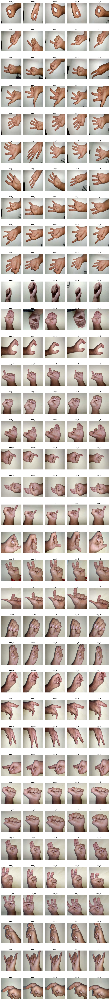

In [48]:
import matplotlib.pyplot as plt

# Select 5 random images for each unique label
num_images_per_label = 5
selected_images = []
selected_labels = []

# Iterate over each unique label
for label in unique_labels:
    # Find indices of images with the current label
    indices = np.where(labels == label)[0]
    # Select 5 random indices if available, otherwise select all available indices
    selected_indices = np.random.choice(indices, size=min(num_images_per_label, len(indices)), replace=False)
    # Add the selected images and labels to the list
    selected_images.extend(images[selected_indices])
    selected_labels.extend(labels[selected_indices])

# Create a grid of subplots to display the images
num_images = len(selected_images)
num_rows = num_images // num_images_per_label
fig, axes = plt.subplots(num_rows, num_images_per_label, figsize=(12, 3*num_rows))

# Iterate over the selected images and labels to display them
for i in range(num_images):
    row = i // num_images_per_label
    col = i % num_images_per_label
    
    image = selected_images[i]
    label = selected_labels[i]
    
    # Display the image
    axes[row, col].imshow(image)
    axes[row, col].axis('off')
    axes[row, col].set_title(label)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


In [49]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Preprocess the images
resized_images = []
for image in images:
    resized_image = tf.image.resize(image, (128, 128))  # Resize the image to (128, 128)
    normalized_image = resized_image / 255.0  # Normalize the image between 0 and 1
    resized_images.append(normalized_image)

In [50]:
# Convert the resized images to a numpy array
resized_images = np.array(resized_images)

# Perform one-hot encoding on the labels
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)
one_hot_labels = tf.keras.utils.to_categorical(encoded_labels)


In [51]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(resized_images, one_hot_labels, test_size=0.2, random_state=42)


In [53]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (14042, 128, 128, 3)
y_train shape: (14042, 36)
X_test shape: (3511, 128, 128, 3)
y_test shape: (3511, 36)


In [54]:

# Define the CNN model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(unique_labels), activation='softmax')
])

In [55]:

# Compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])


In [56]:
# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
439/439 [==============================] - 201s 451ms/step - loss: 1.1313 - accuracy: 0.6745 - val_loss: 0.4011 - val_accuracy: 0.8661
Epoch 2/10
439/439 [==============================] - 187s 427ms/step - loss: 0.2214 - accuracy: 0.9293 - val_loss: 0.2156 - val_accuracy: 0.9305
Epoch 3/10
439/439 [==============================] - 186s 423ms/step - loss: 0.1097 - accuracy: 0.9635 - val_loss: 0.2332 - val_accuracy: 0.9325
Epoch 4/10
439/439 [==============================] - 190s 433ms/step - loss: 0.0639 - accuracy: 0.9808 - val_loss: 0.0966 - val_accuracy: 0.9675
Epoch 5/10
439/439 [==============================] - 187s 425ms/step - loss: 0.0449 - accuracy: 0.9863 - val_loss: 0.0694 - val_accuracy: 0.9795
Epoch 6/10
439/439 [==============================] - 193s 441ms/step - loss: 0.0386 - accuracy: 0.9882 - val_loss: 0.0620 - val_accuracy: 0.9832
Epoch 7/10
439/439 [==============================] - 186s 424ms/step - loss: 0.0238 - accuracy: 0.9925 - val_loss: 0.1949 -

In [57]:
# Save the model
model.save('path_to_save_model.h5')

In [58]:

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print('Test Loss:', test_loss)
print('Test Accuracy:', test_acc)

110/110 [==============================] - 7s 62ms/step - loss: 0.2047 - accuracy: 0.9613
Test Loss: 0.20465119183063507
Test Accuracy: 0.9612646102905273


In [59]:
# Predict labels for X_test
y_pred = model.predict(X_test)

110/110 [==============================] - 8s 64ms/step


In [60]:
# Convert predicted labels to class labels
predicted_labels = [unique_labels[np.argmax(pred)] for pred in y_pred]


In [61]:
# Print some example predictions
for i in range(5):
    print('Image', i+1, 'Prediction:', predicted_labels[i])

Image 1 Prediction: aug_E
Image 2 Prediction: aug_U
Image 3 Prediction: aug_T
Image 4 Prediction: aug_8
Image 5 Prediction: aug_T


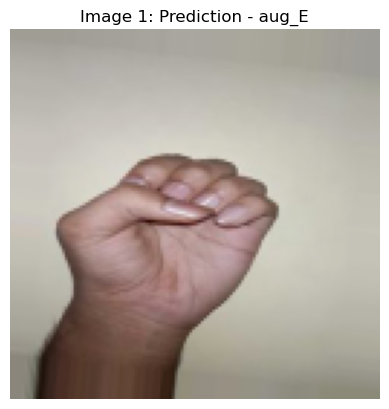

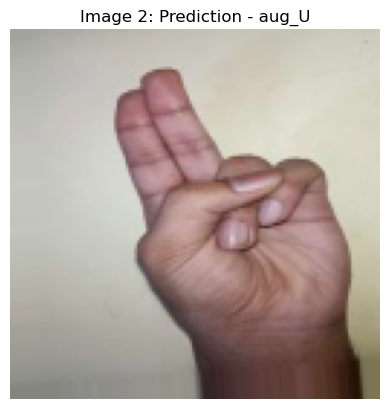

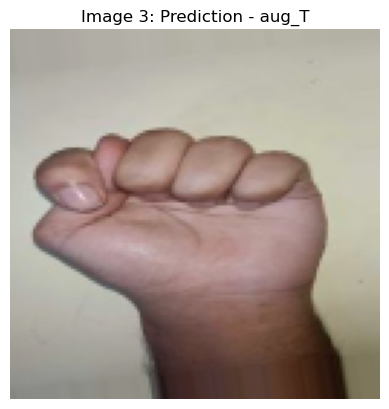

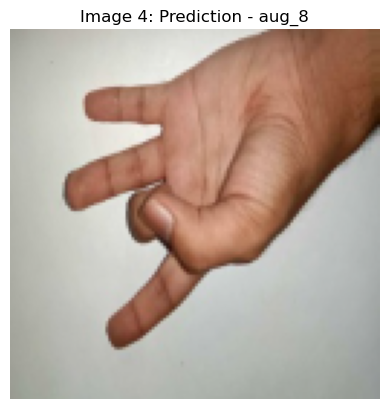

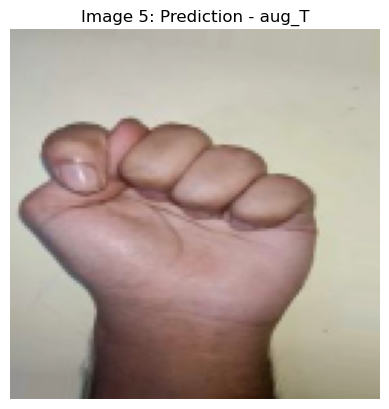

In [62]:
import matplotlib.pyplot as plt

# Print some example predictions
for i in range(5):
    plt.figure()
    plt.imshow(X_test[i])
    plt.title('Image {}: Prediction - {}'.format(i+1, predicted_labels[i]))
    plt.axis('off')
    plt.show()
